In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import sys
import math
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import itertools
from scipy.stats import *
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from sklearn.metrics import roc_auc_score, roc_curve
from _pydecimal import Decimal, Context, ROUND_HALF_UP

In [2]:
def lr(X,y,split_ratio=0.3, return_all=True):
    lr = LogisticRegression(penalty='l2', solver='liblinear', C=1, random_state=0)
    if bool(split_ratio):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=split_ratio, random_state=0)
        sc = StandardScaler()
        sc.fit(X_train)
        X_train_std = sc.transform(X_train)
        X_test_std = sc.transform(X_test)
        X_all_std = sc.transform(X)
        lr.fit(X_train_std, y_train)
        train = lr.predict_proba(X_train_std)
        test = lr.predict_proba(X_test_std)
        all_ = lr.predict_proba(X_all_std)
        if return_all:
            return all_, y
        else:
            return train, test, all_, y_train, y_test, y
    else:
        sc = StandardScaler()
        sc.fit(X)
        X_all_std = sc.transform(X)
        lr.fit(X_all_std, y)
        all_ = lr.predict_proba(X_all_std)
        return all_, y

In [3]:
def confusion_mat(probs, y):
    pred = np.argmax(probs, axis=1)
    pred_array = np.zeros((2, 2))
    for i in range(len(y)):
        pred_array[pred[i], y[i]] += 1
    labels = ['Normal', 'NSCLC']
    
    fig, ax = plt.subplots(figsize=(10,10))
    im = ax.imshow(pred_array, cmap='YlGn')
    #axins = inset_axes(ax,
                   #width="5%",
                   #height="50%",
                   #loc='lower left',
                   #bbox_to_anchor=(1.05, 0., 1, 1),
                   #bbox_transform=ax.transAxes,
                   #borderpad=0)
    #plt.colorbar(im, cax=axins)
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, fontsize=40)
    ax.set_yticklabels(labels, fontsize=40)
    ax.set_ylabel('Predicted labels', fontsize=40)
    ax.set_xlabel('True labels', fontsize=40)
    for i in range(len(labels)):
        for j in range(len(labels)):
            text = ax.text(j, i, pred_array[i, j],
                           ha="center", va="center", color="k", fontsize=35)

    fig.tight_layout()
    plt.show()

In [4]:
def combination(marker_set):
    comb = []
    for i in range(len(marker_set)):
        comb += list(itertools.combinations(list(np.arange(len(marker_set))),i+1))
    return comb

In [5]:
def roc(x, labels):
    y = np.zeros(labels.shape[0])
    y[np.where(labels==0)] = 1
    fpr, tpr, _ = roc_curve(y, x[:,0])
    auc = roc_auc_score(y, x[:,0])
    index = np.argmax(tpr-fpr)
    sen = tpr[index]
    spe = 1-fpr[index]
    return fpr, tpr, auc, sen, spe
    
def roc_plot(fpr, tpr, auc, title):
    plt.figure(figsize=(7,7))
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=2*lw, label='ROC curve (AUC = %0.3f)' % auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('1 - Specificity', fontsize=25)
    plt.ylabel('Sensitivity', fontsize=25)
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)
    plt.title(title, fontsize=25)
    plt.legend(loc="lower right", fontsize=20)
    plt.show()
        

In [36]:
path = sys.path[0]
datafile = path + '/' + 'data_serum_compare.xlsx'
data_ori = pd.read_excel(datafile)

In [37]:
data_ori

,ID,miR-21,miR-210,miR-21_norm,miR-210_norm,miR-21_serum,miR-210_serum,miR-21_serum_norm,miR-210_serum_norm,stage,cancer
0,16,34.025,35.565,-3.065,-0.435,25.125,31.405,-5.275,1.005,0,0
1,17,33.025,35.350,-2.490,1.455,24.130,29.795,-5.200,0.465,0,0
2,18,32.015,34.910,-2.035,-1.265,24.325,31.290,-6.125,0.840,0,0
3,19,35.645,36.345,-1.780,3.530,23.400,29.755,-4.985,1.370,0,0
4,21,33.085,34.780,-3.760,0.485,24.030,30.905,-5.270,1.605,0,0
5,22,34.380,37.035,-5.355,0.130,23.890,29.735,-5.400,0.445,0,0
6,23,32.875,35.580,-2.250,1.405,23.785,30.340,-4.860,1.695,0,0
7,27,34.005,35.305,-2.540,2.565,23.470,30.070,-4.460,2.140,0,0
8,28,32.980,35.675,-2.915,-0.005,22.140,28.720,-5.520,1.060,0,0
9,30,36.270,35.205,-0.625,0.405,23.845,30.085,-4.995,1.245,0,0


In [38]:
data_slice = data_ori.loc[:, ['ID', 'stage', 'miR-21', 'miR-210', 'miR-21_norm', 'miR-210_norm', 
                              'miR-21_serum', 'miR-210_serum', 'miR-21_serum_norm', 'miR-210_serum_norm', 'cancer']]
data = data_slice.dropna(axis=0,how='any')
datat = data.T

In [39]:
data_roc = data_ori.loc[:, ['ID', 'stage', 'cancer', 'miR-21', 'miR-210', 'miR-21_norm', 'miR-210_norm', 
                              'miR-21_serum', 'miR-210_serum', 'miR-21_serum_norm', 'miR-210_serum_norm']].dropna(axis=0,how='any')

In [40]:
data_roc

,ID,stage,cancer,miR-21,miR-210,miR-21_norm,miR-210_norm,miR-21_serum,miR-210_serum,miR-21_serum_norm,miR-210_serum_norm
0,16,0,0,34.025,35.565,-3.065,-0.435,25.125,31.405,-5.275,1.005
1,17,0,0,33.025,35.350,-2.490,1.455,24.130,29.795,-5.200,0.465
2,18,0,0,32.015,34.910,-2.035,-1.265,24.325,31.290,-6.125,0.840
3,19,0,0,35.645,36.345,-1.780,3.530,23.400,29.755,-4.985,1.370
4,21,0,0,33.085,34.780,-3.760,0.485,24.030,30.905,-5.270,1.605
5,22,0,0,34.380,37.035,-5.355,0.130,23.890,29.735,-5.400,0.445
6,23,0,0,32.875,35.580,-2.250,1.405,23.785,30.340,-4.860,1.695
7,27,0,0,34.005,35.305,-2.540,2.565,23.470,30.070,-4.460,2.140
8,28,0,0,32.980,35.675,-2.915,-0.005,22.140,28.720,-5.520,1.060
9,30,0,0,36.270,35.205,-0.625,0.405,23.845,30.085,-4.995,1.245


In [42]:
markers = dict()
markers['norm_exo'] = ['miR-21_norm', 'miR-210_norm']
markers['norm_serum'] = ['miR-21_serum_norm', 'miR-210_serum_norm']
markers['exo'] = ['miR-21', 'miR-210']
markers['serum'] = ['miR-21_serum', 'miR-210_serum']

In [43]:
vslist = dict()
vslist['main'] = ['Non-cancer vs NSCLC', 'Normal vs NSCLC',
                  'Early stage NSCLC vs Late stage NSCLC']
vslist['sup'] = ['Normal vs Early stage NSCLC', 
                 'Normal vs Late stage NSCLC', 
                 'Non-cancer vs Early stage NSCLC', 'Non-cancer vs Late stage NSCLC']
indices = dict()
indices['Normal'] = data_roc['stage'] == 0
#indices['High-risk'] = data_roc['stage'] == 1
indices['Early stage NSCLC'] = data_roc['stage'] == 2
indices['Late stage NSCLC'] = data_roc['stage'] == 3
indices['Non-cancer'] = data_roc['stage'] < 2
indices['NSCLC'] = data_roc['stage'] > 1

In [44]:
split_ratio = 0
lw = 2

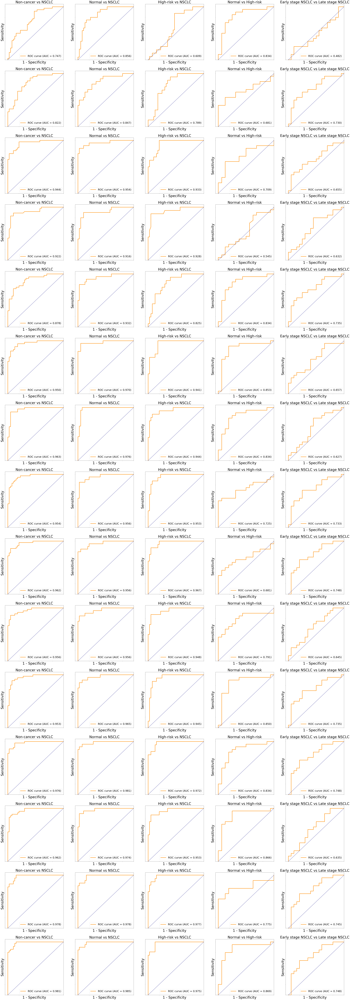

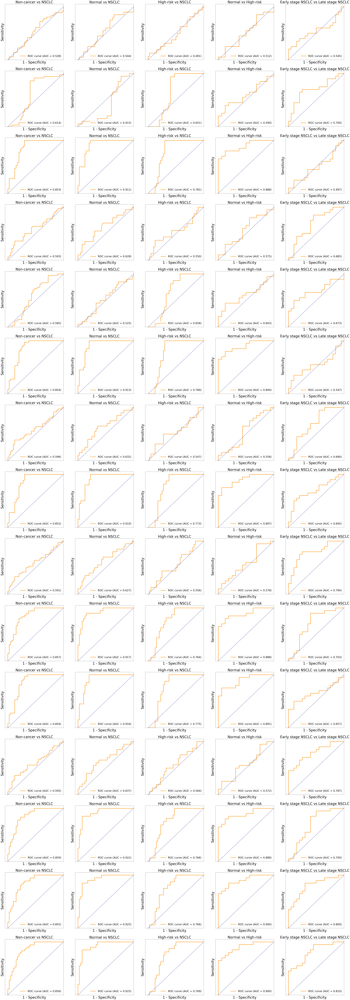

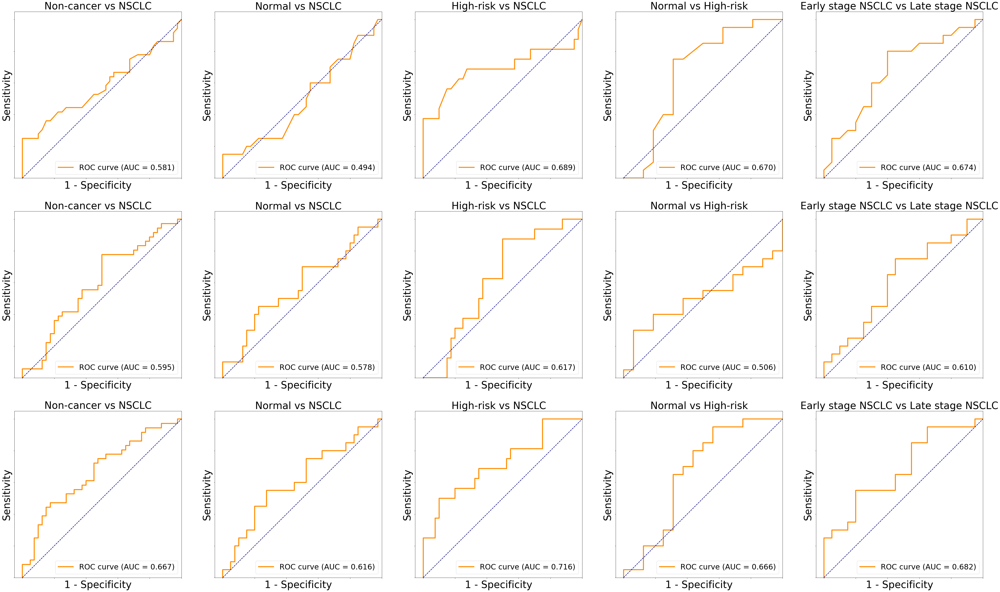

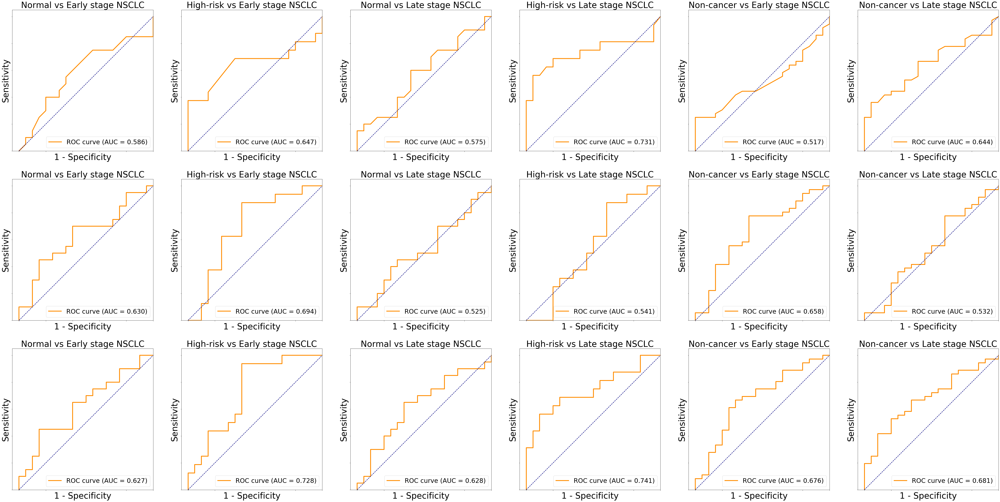

In [25]:
for vs_name in ['norm_exo', 'norm_serum', 'exo', 'serum']:
    num_vs = len(vslist[vs_name])
    results_df = dict()
    for name_ in ['sensor', 'conventional', 'nta']:
        mkset = markers[name_]
        comb = combination(mkset)
        index_ = []
        for mk_idx in comb:
            index_.append(' + '.join([mkset[i] for i in mk_idx]))
        num_comb = len(index_)
        fig, axs = plt.subplots(num_comb, num_vs, figsize=(14*num_vs,14*num_comb))
        results = dict()
        for x_plot, comp in enumerate(vslist[vs_name]):
            results[f'{comp} SEN'] = []
            results[f'{comp} SPE'] = []
            results[f'{comp} AUC'] = []
            label1 = comp.split(' vs ')[0]
            label2 = comp.split(' vs ')[1]
            data_slice = data_roc[indices[label1]|indices[label2]]
            y = np.array(indices[label2]).astype('int')[indices[label1]|indices[label2]]
            for y_plot, mk_idx in enumerate(comb):
                current_mks = [mkset[i] for i in mk_idx]
                X = np.array(data_slice.loc[:, current_mks])
                all_, y = lr(X, y, split_ratio=split_ratio)
                fpr, tpr, auc, sen, spe = roc(all_, y)
                results[f'{comp} SEN'].append(sen)
                results[f'{comp} SPE'].append(spe)
                results[f'{comp} AUC'].append(auc)
                axs[y_plot, x_plot].plot(fpr, tpr, color='darkorange',
                                         lw=2*lw, label='ROC curve (AUC = %0.3f)' % auc)
                axs[y_plot, x_plot].plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
                axs[y_plot, x_plot].set_xlim([-0.05, 1.0])
                axs[y_plot, x_plot].set_ylim([0.0, 1.05])
                axs[y_plot, x_plot].set_xlabel('1 - Specificity', fontsize=40)
                axs[y_plot, x_plot].set_ylabel('Sensitivity', fontsize=40)
                axs[y_plot, x_plot].set_xticklabels(axs[y_plot, x_plot].get_xticklabels(), fontsize=40)
                axs[y_plot, x_plot].set_yticklabels(axs[y_plot, x_plot].get_yticklabels(), fontsize=40)
                axs[y_plot, x_plot].set_title(comp, fontsize=40)
                axs[y_plot, x_plot].legend(loc="lower right", fontsize=30)
        results_df[name_] = pd.DataFrame(results, index=index_)
        fig.savefig(f'{vs_name}_{name_}.jpg')
    with pd.ExcelWriter(f'{vs_name}.xlsx') as writer: 
        for _name_ in ['sensor', 'conventional', 'nta']:
            results_df[_name_].to_excel(writer, sheet_name=_name_)

In [45]:
for vs_name in ['main', 'sup']:
    num_vs = len(vslist[vs_name])
    results_df = dict()
    for name_ in ['norm_exo', 'norm_serum', 'exo', 'serum']:
        mkset = markers[name_]
        comb = combination(mkset)
        index_ = []
        for mk_idx in comb:
            index_.append(' + '.join([mkset[i] for i in mk_idx]))
        num_comb = len(index_)
        results = dict()
        for x_plot, comp in enumerate(vslist[vs_name]):
            results[f'{comp} SEN'] = []
            results[f'{comp} SPE'] = []
            results[f'{comp} AUC'] = []
            label1 = comp.split(' vs ')[0]
            label2 = comp.split(' vs ')[1]
            data_slice = data_roc[indices[label1]|indices[label2]]
            y = np.array(indices[label2]).astype('int')[indices[label1]|indices[label2]]
            for y_plot, mk_idx in enumerate(comb):
                current_mks = [mkset[i] for i in mk_idx]
                X = np.array(data_slice.loc[:, current_mks])
                all_, y = lr(X, y, split_ratio=split_ratio)
                fpr, tpr, auc, sen, spe = roc(all_, y)
                results[f'{comp} SEN'].append(sen)
                results[f'{comp} SPE'].append(spe)
                results[f'{comp} AUC'].append(auc)
                fig = plt.figure(figsize=(7,7))
                plt.plot(fpr, tpr, color='darkorange',
                         lw=2*lw)
                plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
                plt.xlim([-0.05, 1.0])
                plt.ylim([0.0, 1.05])
                plt.xlabel('1 - Specificity', fontsize=25)
                plt.ylabel('Sensitivity', fontsize=25)
                plt.xticks(fontsize=25)
                plt.yticks(fontsize=25)
                #plt.title(comp, fontsize=25)
                #plt.legend(loc="lower right", fontsize=20)
                plt.text(0.5, 0.3, 
                         'AUC = %s' % str(Context(prec=3, rounding=ROUND_HALF_UP).create_decimal('%.5f'%auc)), 
                         fontsize=20)
                plt.tight_layout()
                fig.savefig(f'serum_compare/{vs_name}/{name_}/{y_plot}_{x_plot}_{index_[y_plot]}_{comp}.jpg')
                plt.close()
        results_df[name_] = pd.DataFrame(results, index=index_)
    with pd.ExcelWriter(f'serum_compare/{vs_name}.xlsx') as writer: 
        for _name_ in ['norm_exo', 'norm_serum', 'exo', 'serum']:
            results_df[_name_].to_excel(writer, sheet_name=_name_)

In [73]:
str(Context(prec=3, rounding=ROUND_HALF_UP).create_decimal('0.7'))

'0.7'

In [79]:
'AUC = %s' % str(Context(prec=3, rounding=ROUND_HALF_UP).create_decimal('%.5f'%auc))

'AUC = 0.700'

In [78]:
auc=0.7

In [71]:
str(round(auc, 4))

'0.7625'

In [49]:
datat

,0,1,2,3,4,5,6,7,8,9,...,66,67,68,69,70,71,72,73,74,75
ID,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000,9.000000,10.000000,...,67.000000,68.000000,69.000000,70.000000,71.000000,72.000000,73.000000,74.000000,75.000000,76.000000
stage,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
EGFR,2.251874,1.119553,2.726926,1.970555,2.554122,2.585002,0.755243,1.255913,0.681901,2.362804,...,1.485233,2.514078,4.015251,1.047104,3.643881,3.539433,2.266631,2.998169,4.771376,6.536836
EGFR+ miR-21,0.099057,0.096774,0.260417,0.104396,0.758621,0.211429,0.137143,0.361111,0.075758,0.113861,...,0.650000,0.406593,0.988701,0.591623,0.635294,0.715909,0.267760,0.294444,0.587209,0.412088
LG3BP,0.629213,0.552169,0.523337,0.508696,0.762124,0.983524,0.937080,1.089360,1.650223,0.740296,...,3.998524,1.896731,3.717407,1.388838,6.403149,2.289627,1.292108,1.424343,1.967888,1.320487
LG3BP+ miR-210,0.101064,0.091837,0.086705,0.083333,0.121693,0.105556,0.167568,0.103448,0.179641,0.138728,...,0.193069,0.156566,0.152709,0.112360,0.166667,0.180233,0.150538,0.141361,0.134831,0.103030
cancer,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


[None, None, None, None, None, None, None, None]

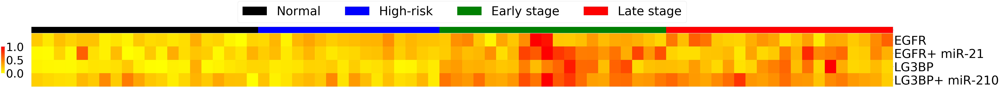

In [51]:
stage_dict = {3: 'Late stage', 2: 'Early stage', 1: 'High-risk', 0: 'Normal'}
cdict = dict(zip(datat.iloc[1,:].unique(), "kbgr"))
col_colors = datat.iloc[1,:].map(cdict)
g = sns.clustermap(datat.iloc[2:6, :], vmin=0, vmax=1, z_score=None, standard_scale=0, col_colors=col_colors, figsize=(10, 10),
                   cmap='autumn_r', xticklabels=False, yticklabels=True, row_cluster=False, col_cluster=False)
for label in datat.iloc[1,:].unique():
    g.ax_col_dendrogram.bar(0, 0, color=cdict[label],
                            label=stage_dict[int(label)], linewidth=0)
    
hm = g.ax_heatmap.get_position() 
g.ax_heatmap.set_position([hm.x0, hm.y0+hm.height*0.2, hm.width*12, hm.height*0.8]) 
col = g.ax_col_dendrogram.get_position() 
g.ax_col_dendrogram.set_position([col.x0, col.y0, col.width*12, col.height*0.8]) 
cc = g.ax_col_colors.get_position()
g.ax_col_colors.set_position([cc.x0, cc.y0, cc.width*12, cc.height*1.5]) 
cb = g.cax.get_position()
g.cax.set_position([cb.x0*0.2, hm.y0+hm.height*0.4, cb.width, hm.height*0.4]) 

#control the fontsize and location of column color bar legend
g.ax_col_dendrogram.legend(loc="center", bbox_to_anchor=(0.25, 1, 0.5, 0.5), ncol=4, fontsize=75)
#control the fontsize of y tick labels
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = 75)
#control the label of column color bar
g.ax_col_colors.set_yticklabels(g.ax_col_colors.get_ymajorticklabels(), fontsize = 0)
#control the fontsize of colorbar tick labels
g.cax.yaxis.set_major_locator(ticker.MultipleLocator(0.5))
g.cax.yaxis.set_ticklabels([0., 0., 0.5, 1.], fontsize = 70)

plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

[None, None, None, None, None, None, None, None]

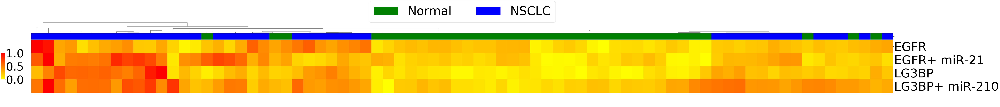

In [52]:
stage_dict = {1: 'NSCLC', 0: 'Normal'}
cdict = dict(zip(datat.iloc[1,:].unique(), "gb"))
col_colors = datat.iloc[-1,:].map(cdict)
g = sns.clustermap(datat.iloc[2:6, :], vmin=0, vmax=1, z_score=None, standard_scale=0, col_colors=col_colors, figsize=(10, 10),
                   cmap='autumn_r', xticklabels=False, yticklabels=True, row_cluster=False, col_cluster=True)
for label in datat.iloc[-1,:].unique():
    g.ax_col_dendrogram.bar(0, 0, color=cdict[label],
                            label=stage_dict[int(label)], linewidth=0)
    
hm = g.ax_heatmap.get_position() 
g.ax_heatmap.set_position([hm.x0, hm.y0+hm.height*0.2, hm.width*12, hm.height*0.8]) 
col = g.ax_col_dendrogram.get_position() 
g.ax_col_dendrogram.set_position([col.x0, col.y0, col.width*12, col.height*0.8]) 
cc = g.ax_col_colors.get_position()
g.ax_col_colors.set_position([cc.x0, cc.y0, cc.width*12, cc.height*1.5]) 
cb = g.cax.get_position()
g.cax.set_position([cb.x0*0.2, hm.y0+hm.height*0.4, cb.width, hm.height*0.4]) 

#control the fontsize and location of column color bar legend
g.ax_col_dendrogram.legend(loc="center", bbox_to_anchor=(0.25, 1.5, 0.5, 0.5), ncol=2, fontsize=75)
#control the fontsize of y tick labels
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = 75)
#control the label of column color bar
g.ax_col_colors.set_yticklabels(g.ax_col_colors.get_ymajorticklabels(), fontsize = 0)
#control the fontsize of colorbar tick labels
g.cax.yaxis.set_major_locator(ticker.MultipleLocator(0.5))
g.cax.yaxis.set_ticklabels([0., 0., 0.5, 1.], fontsize = 70)

plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

In [32]:
X = np.array(data.iloc[:, 2:6])
y = np.array(data['stage']!=0).astype('int')
train, test, all_, y_train, y_test, y = lr(X, y)

/Users/yangyunchen/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


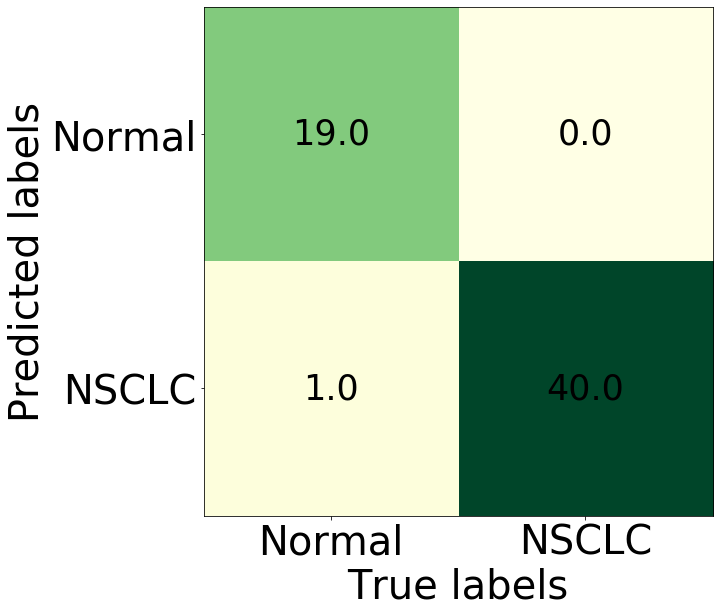

In [33]:
confusion_mat(all_, y)

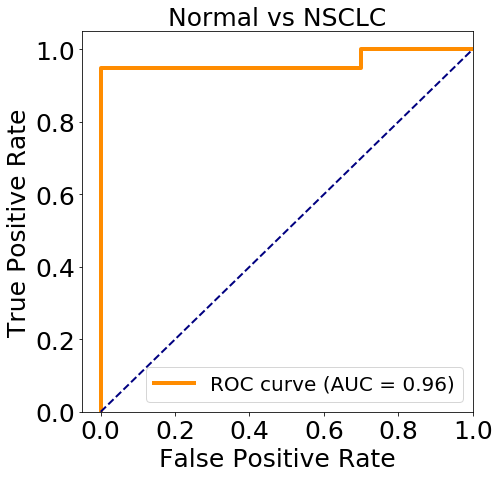

Sensitivity = 0.95
Specificty = 1.00


In [34]:
roc(all_,y)

In [35]:
np.argmax(all_, axis=-1)

array([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [36]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

/Users/yangyunchen/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


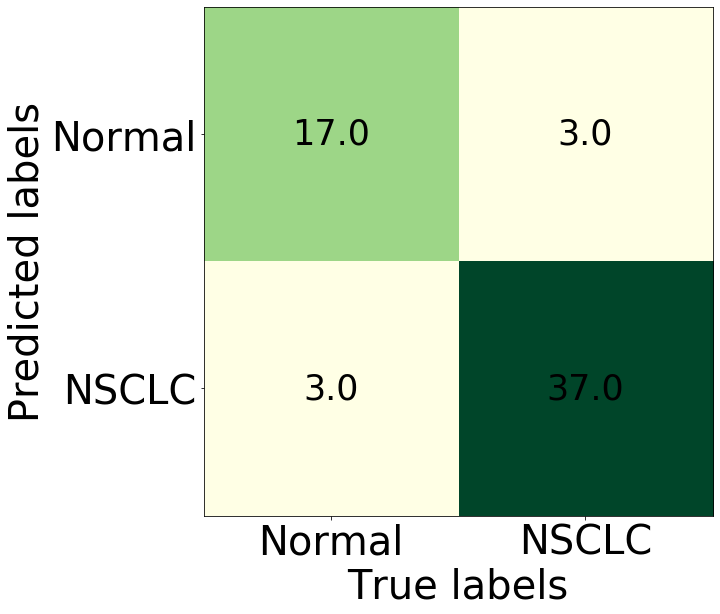

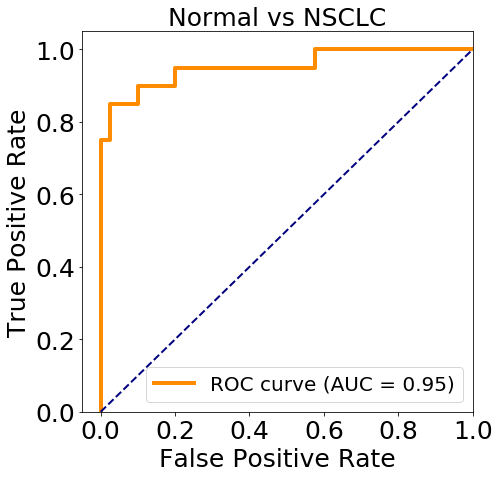

Sensitivity = 0.85
Specificty = 0.97


In [14]:
X = np.array(data.iloc[:, 4:5])
y = np.array(data['stage']!=0).astype('int')
train, test, all_, y_train, y_test, y = lr(X, y)
confusion_mat(all_, y)
roc(all_,y)

/Users/yangyunchen/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


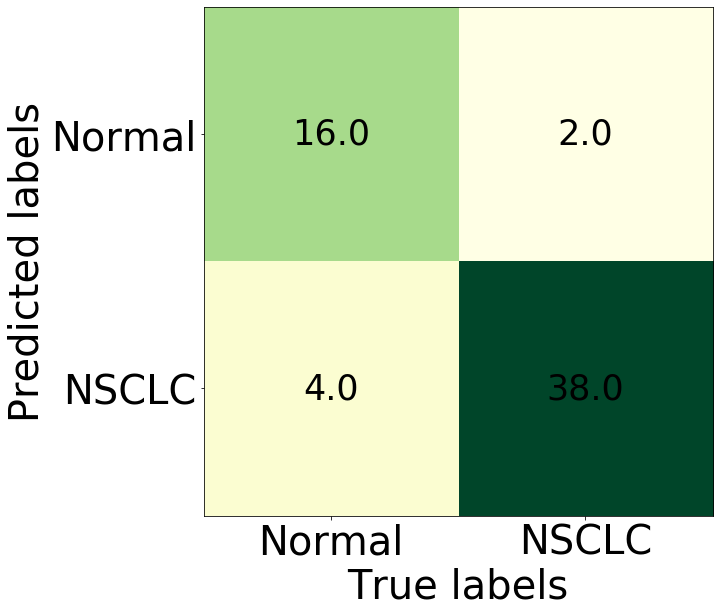

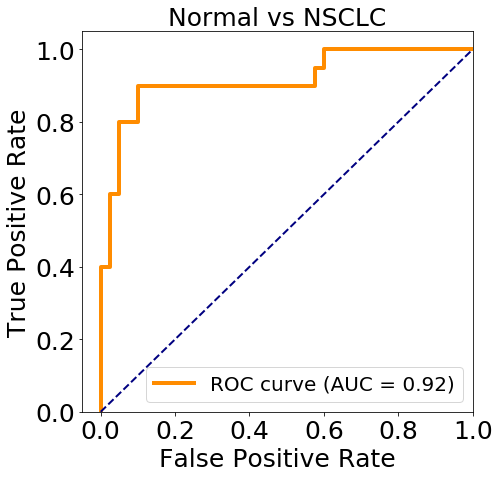

Sensitivity = 0.90
Specificty = 0.90


In [15]:
X = np.array(data.iloc[:, 5:6])
y = np.array(data['stage']!=0).astype('int')
train, test, all_, y_train, y_test, y = lr(X, y)
confusion_mat(all_, y)
roc(all_,y)

/Users/yangyunchen/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


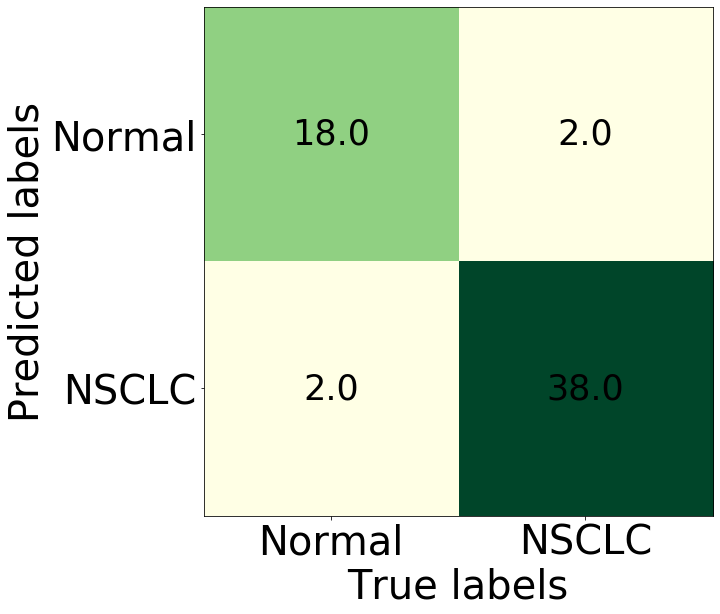

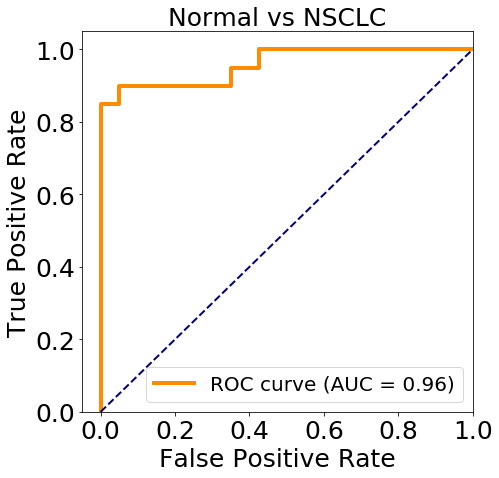

Sensitivity = 0.85
Specificty = 1.00


In [48]:
X = np.array(data.iloc[:, 4:6])
y = np.array(data['stage']!=0).astype('int')
train, test, all_, y_train, y_test, y = lr(X, y)
confusion_mat(all_, y)
roc(all_,y)

In [30]:
all_.argmax(axis=-1)

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [31]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [49]:
X = np.array(data_ori.loc[:, ['EGFR', 'EGFR+ miR-21']])
y = np.array(data_ori['stage']!=0).astype('int')
train, test, all_, y_train, y_test, y = lr(X, y)

/Users/yangyunchen/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


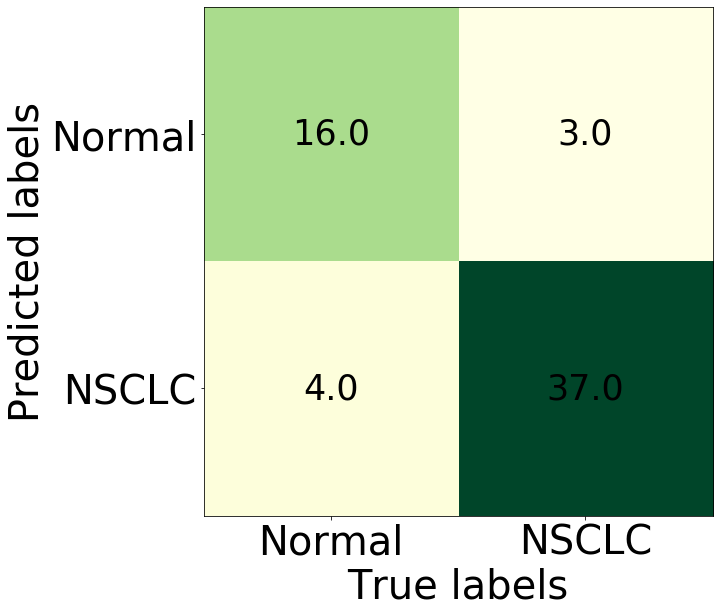

In [50]:
confusion_mat(all_, y)

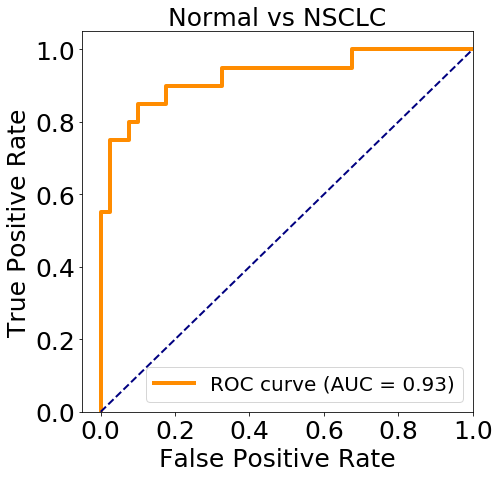

Sensitivity = 0.85
Specificty = 0.90


In [51]:
roc(all_,y)

/Users/yangyunchen/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


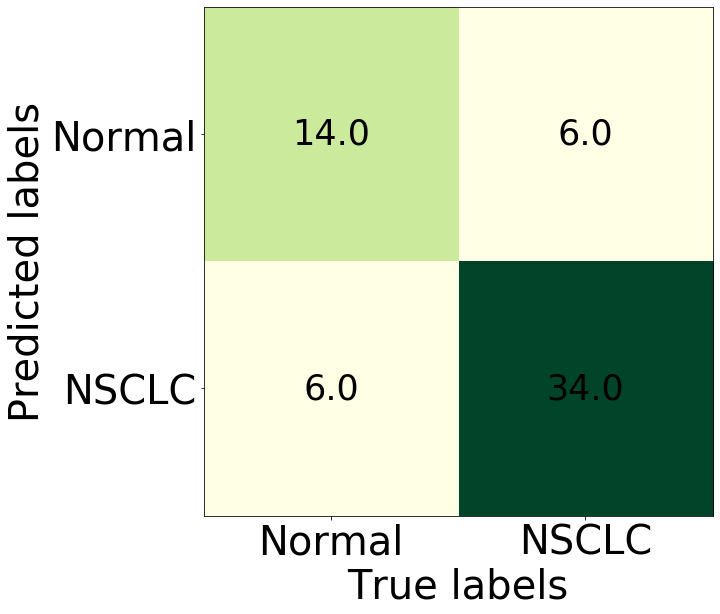

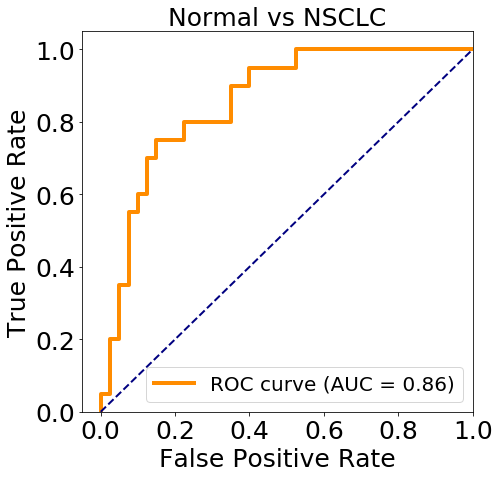

Sensitivity = 0.75
Specificty = 0.85


In [52]:
X = np.array(data_ori.loc[:, ['EGFR']])
y = np.array(data_ori['stage']!=0).astype('int')
train, test, all_, y_train, y_test, y = lr(X, y)
confusion_mat(all_, y)
roc(all_,y)

/Users/yangyunchen/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


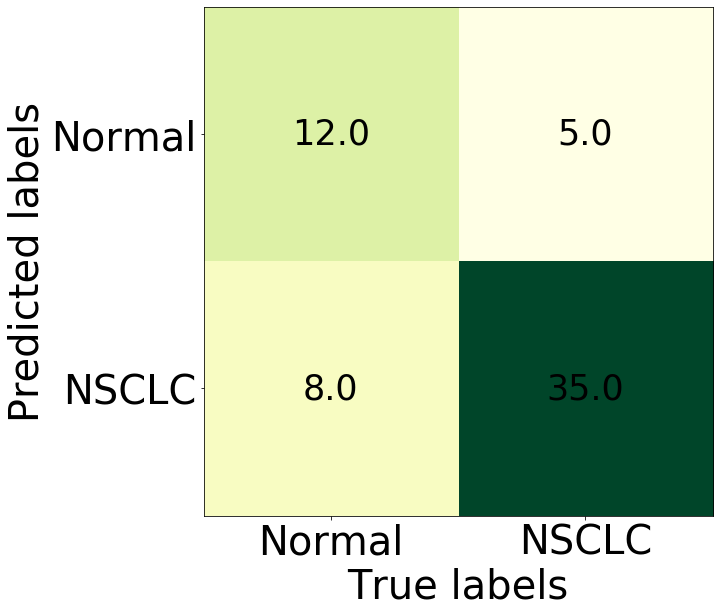

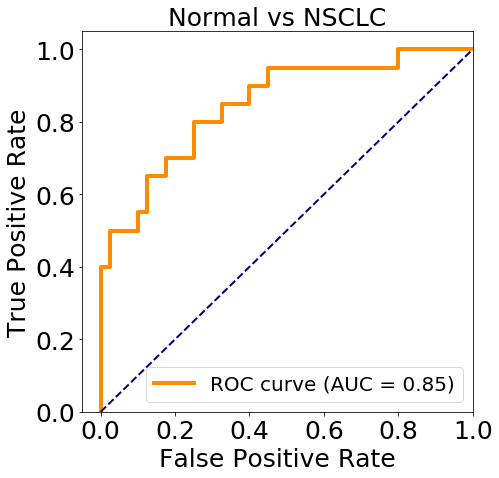

Sensitivity = 0.80
Specificty = 0.75


In [53]:
X = np.array(data_ori.loc[:, ['EGFR+ miR-21']])
y = np.array(data_ori['stage']!=0).astype('int')
train, test, all_, y_train, y_test, y = lr(X, y)
confusion_mat(all_, y)
roc(all_,y)

/Users/yangyunchen/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


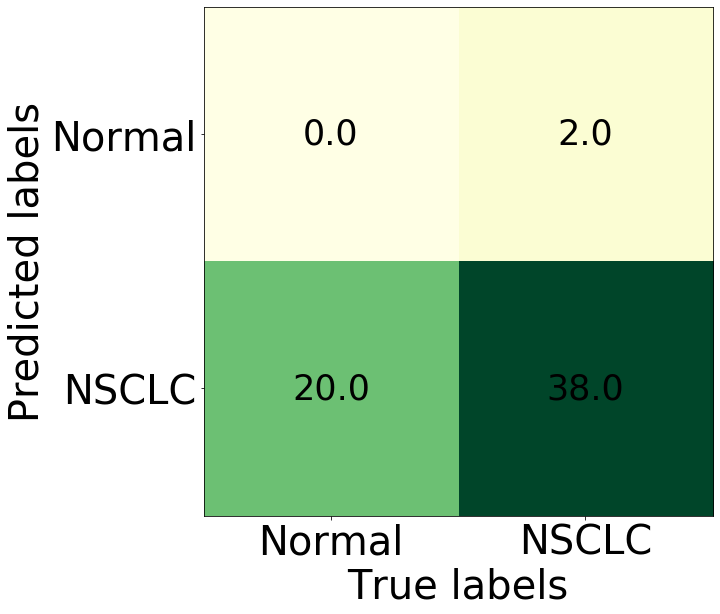

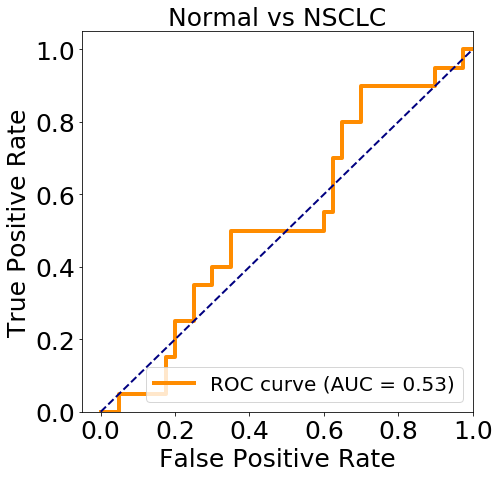

In [37]:
X = np.array(data_ori.loc[:, ['ELISA-EGFR', 'EGFR+ miR-21-PCR']])
y = np.array(data_ori['stage']!=0).astype('int')
train, test, all_, y_train, y_test, y = lr(X, y)
confusion_mat(all_, y)
roc(all_,y)